In [1]:
import os
import pandas as pd
import scanpy as sc
import anndata as ad
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import font_manager as fm


In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=300, facecolor="white")
sc.set_figure_params(fontsize=12)
sc.settings.vector_friendly = False


scanpy==1.10.3 anndata==0.10.9 umap==0.5.7 numpy==2.0.2 scipy==1.13.1 pandas==2.2.3 scikit-learn==1.5.2 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13


# Time to subset the T cells

## Load Object

In [3]:
#load annotated object
adata = sc.read_h5ad("Final_Notebooks/Final_Objects/PBMC_Clustered_Annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 120853 × 1631
    obs: 'ExperimentID', 'ConditionID', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'Donor', 'Condition', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'predicted_doublet_0.2', 'predicted_doublet_0.25', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'Annotations_broad'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    u

In [4]:
#Subset for only T cells
adata_T = adata[adata.obs["Annotations_broad"].isin(["Helper T Cells",'Cytotoxic T Cells'])].copy()
adata_T

AnnData object with n_obs × n_vars = 68806 × 1631
    obs: 'ExperimentID', 'ConditionID', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'Donor', 'Condition', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'predicted_doublet_0.2', 'predicted_doublet_0.25', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'Annotations_broad'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    un

## Determine CD4+ and CD8+ T cells

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:16)
computing neighbors
    using 'X_pca' with n_pcs = 12
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:25)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:47)
running Leiden clustering


/tmp/ipykernel_2978136/389821388.py:34: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


    finished: found 26 clusters and added
    'leiden_1.7', the cluster labels (adata.obs, categorical) (0:00:23)
running Leiden clustering
    finished: found 27 clusters and added
    'leiden_1.8', the cluster labels (adata.obs, categorical) (0:00:26)
running Leiden clustering
    finished: found 28 clusters and added
    'leiden_1.9', the cluster labels (adata.obs, categorical) (0:00:20)
running Leiden clustering
    finished: found 28 clusters and added
    'leiden_2.0', the cluster labels (adata.obs, categorical) (0:00:16)
running Leiden clustering
    finished: found 31 clusters and added
    'leiden_2.1', the cluster labels (adata.obs, categorical) (0:00:18)


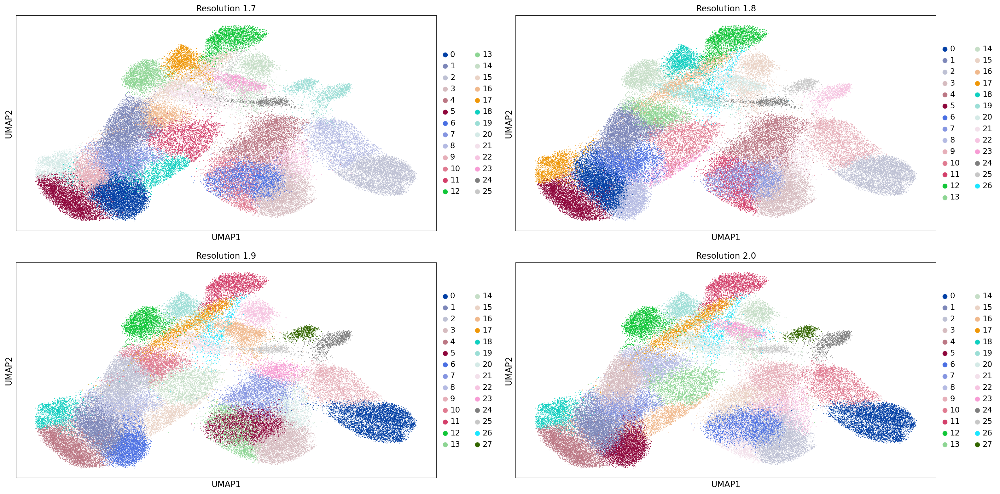

In [5]:
# Convert the raw (log-normalized) data back to a full AnnData object for further analysis
adata_T = adata_T.raw.to_adata()

# Set log base to None (defaults to natural log)
adata_T.uns["log1p"]["base"] = None

# Identify highly variable genes across batches (samples)
sc.pp.highly_variable_genes(adata_T, batch_key="sample")

# Store the raw object for future reference
adata_T.raw = adata_T

# Subset to highly variable genes
adata_T = adata_T[:, adata_T.var.highly_variable]

# Scale data (zero mean, unit variance), and clip extreme values at 10
sc.pp.scale(adata_T, max_value=10)

# Perform PCA using arpack solver (robust for sparse matrices)
sc.tl.pca(adata_T, svd_solver="arpack")

# Compute neighborhood graph using top 12 principal components
sc.pp.neighbors(adata_T, n_pcs=12)

# Run UMAP for 2D embedding
sc.tl.umap(adata_T)

# Define Leiden clustering resolutions to explore
resolutions = np.arange(1.7, 2.1, 0.1)  # 1.7, 1.8, 1.9, 2.0

# Run Leiden clustering at multiple resolutions
for resolution in resolutions:
    key_added = f'leiden_{resolution:.1f}'  # e.g., 'leiden_1.7'
    sc.tl.leiden(
        adata_T,
        resolution=resolution,
        random_state=0,
        key_added=key_added
    )

# Plot UMAPs for a subset of resolutions
plot_resolutions = np.arange(1.7, 2.0, 0.1)

# Create 2x2 subplot layout for side-by-side comparison
n_rows = 2
n_cols = 2
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 10))
axs = axs.flatten()

# Generate UMAP plots colored by Leiden cluster for each resolution
for i, resolution in enumerate(plot_resolutions):
    key_added = f'leiden_{resolution:.1f}'
    sc.pl.umap(
        adata_T,
        color=[key_added],
        title=f'Resolution {resolution:.1f}',
        ax=axs[i],
        show=False,
        size=5  # Adjust dot size for density
    )

# Adjust subplot spacing
plt.tight_layout()

# Show all plots
plt.show()


<Axes: title={'center': 'leiden_2.0'}, xlabel='UMAP1', ylabel='UMAP2'>

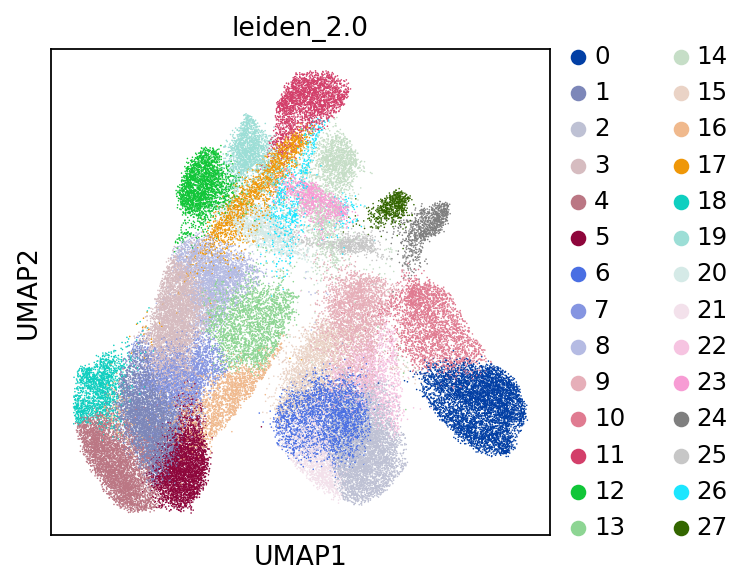

In [6]:
    sc.pl.umap(
        adata_T,
        color=[
               "leiden_2.0"
              ],
        show=False,  # Prevent showing the plot to handle it manually
        size= 2,ncols=3
    )

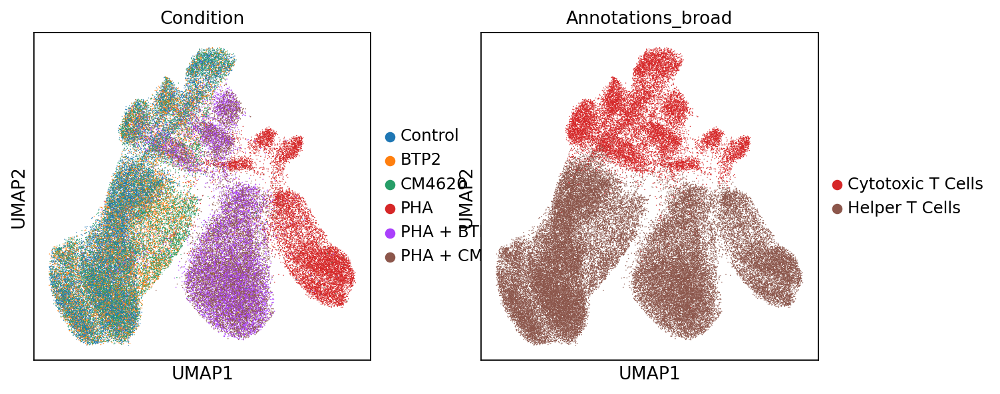

In [7]:
sc.pl.umap(adata_T, color=["Condition",'Annotations_broad'])

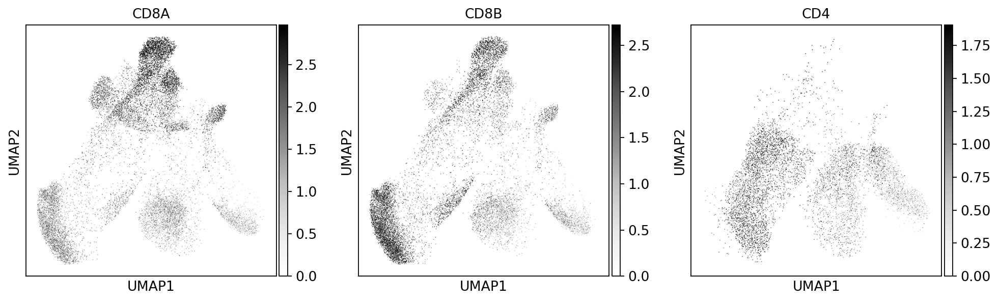

In [8]:
sc.pl.umap(adata_T, color=["CD8A","CD8B","CD4"],cmap='Greys',vmax='p99.5')

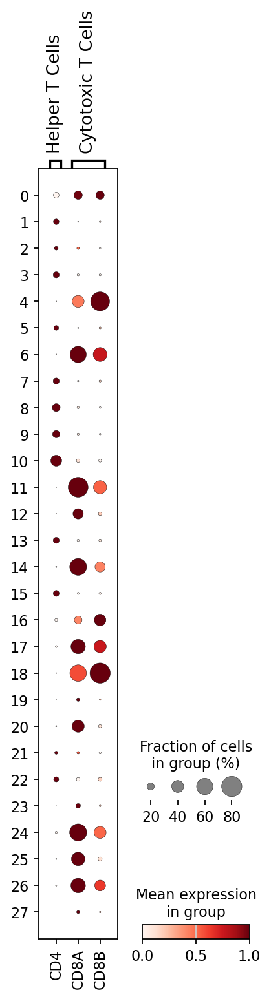

In [9]:
# Define minimal marker sets for T cell subtypes
replacement_dict = {
    'Helper T Cells': ['CD4'],                # Canonical CD4 marker
    'Cytotoxic T Cells': ['CD8A', 'CD8B']     # Canonical CD8 markers
}

# Generate a dot plot of key T cell markers across Leiden clusters at resolution 2.0
sc.pl.dotplot(
    adata_T,
    var_names=replacement_dict,       # Dictionary mapping labels to gene sets
    groupby="leiden_2.0",             # Cluster resolution to group by
    dot_min=0,                        # Minimum dot size for expression visualization
    dot_max=0.8,                      # Maximum dot size
    dendrogram=False,                 # No dendrogram to preserve original cluster order
    standard_scale='group'            # Scale each gene within its group across clusters
)


In [10]:
# Define a mapping from Leiden clusters (resolution 2.0) to T cell subcluster labels
broad_cluster_names = {
    "0":  "Tc_0",
    "1":  "Th_1",
    "2":  "Th_2",
    "3":  "Th_3",
    "4":  "Tc_4",
    "5":  "Th_5",
    "6":  "Tc_6",
    "7":  "Th_7",
    "8":  "Th_8",
    "9":  "Th_9",
    "10": "Th_10",
    "11": "Tc_11",
    "12": "Tc_12",
    "13": "Th_13",
    "14": "Tc_14",
    "15": "Th_15",
    "16": "Tc_16",
    "17": "Tc_17",
    "18": "Tc_18",
    "19": "Tc_19",
    "20": "Tc_20",
    "21": "Th_21",
    "22": "Th_22",
    "23": "Tc_23",
    "24": "Tc_24",
    "25": "Tc_25",
    "26": "Tc_26",
    "27": "Tc_27"
}

# Apply the mapping to annotate each cluster with its corresponding T cell subcluster label
adata_T.obs['T_cell_sub'] = adata_T.obs['leiden_2.0'].map(broad_cluster_names)


In [11]:
# Create a new column that categorizes each T cell subcluster as either CD4+ or CD8+
# Based on whether the subcluster label contains 'Th' (Helper T cells) or not (assumed CD8+ T cells)
adata_T.obs['CD4_CD8_split'] = adata_T.obs['T_cell_sub'].map(
    lambda x: 'CD4+ T Cells' if 'Th' in x else 'CD8+ T Cells'
)

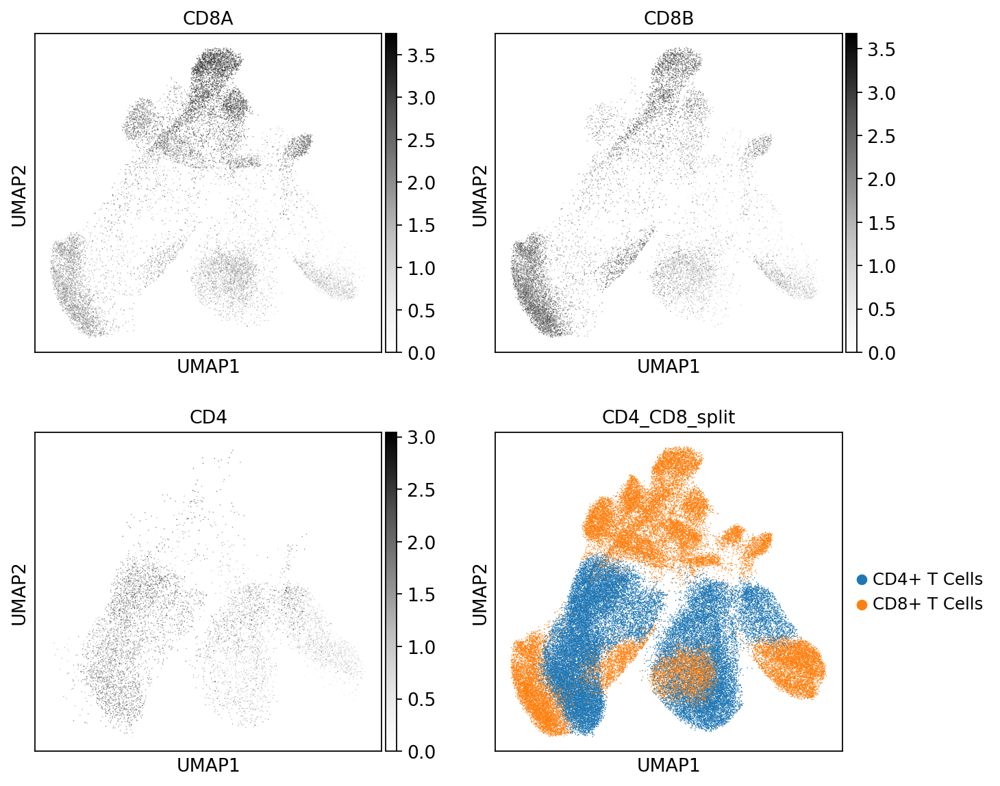

In [12]:
sc.pl.umap(adata_T, color=['CD8A','CD8B','CD4', 'CD4_CD8_split'],cmap='Greys',ncols=2)


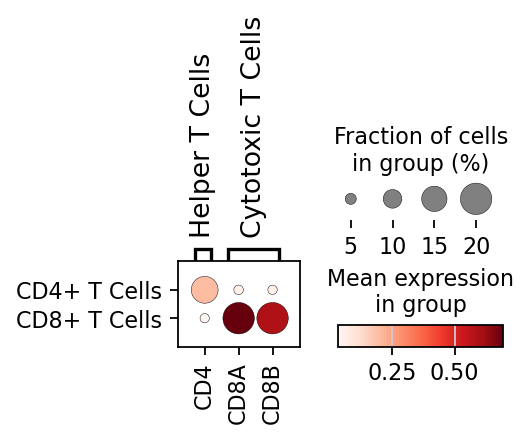

In [13]:
sc.pl.dotplot(adata_T, replacement_dict,
              groupby="CD4_CD8_split",dot_min=0,dot_max=0.2, dendrogram=False)

## Subset CD4 and CD8 cells to find any missclassified T cells

In [14]:
#Select the CD8+ T cells
adata_CD8 = adata_T[adata_T.obs['CD4_CD8_split']=='CD8+ T Cells']
adata_CD8

View of AnnData object with n_obs × n_vars = 32236 × 1443
    obs: 'ExperimentID', 'ConditionID', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'Donor', 'Condition', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'predicted_doublet_0.2', 'predicted_doublet_0.25', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'Annotations_broad', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'leiden_2.1', 'T_cell_sub', 'CD4_CD8_split'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispe

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:23)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_2.1', the cluster labels (adata.obs, categorical) (0:00:04)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_2.2', the cluster labels (adata.obs, categorical) (0:00:03)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_2.3', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 26 clusters and added
    '

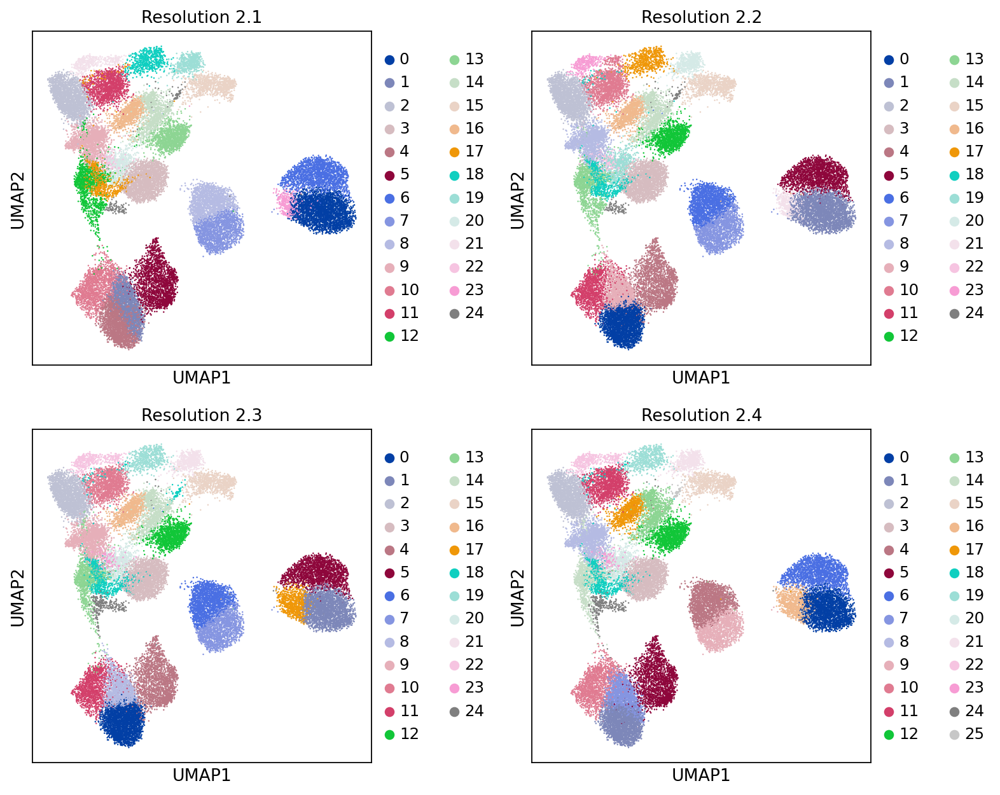

In [15]:
# Restore full AnnData object from raw (log-normalized) data for downstream processing
adata_CD8 = adata_CD8.raw.to_adata()

# Ensure log1p base is set to None (natural log)
adata_CD8.uns["log1p"]["base"] = None

# Identify highly variable genes across batches (samples)
sc.pp.highly_variable_genes(adata_CD8, batch_key="sample")

# Store raw object for future reference (e.g., full gene expression space)
adata_CD8.raw = adata_CD8

# Subset to only highly variable genes
adata_CD8 = adata_CD8[:, adata_CD8.var.highly_variable]

# Scale each gene (mean=0, variance=1), clip extreme values at 10
sc.pp.scale(adata_CD8, max_value=10)

# Run PCA with ARPACK (efficient for sparse matrices)
sc.tl.pca(adata_CD8, svd_solver="arpack")

# Compute neighborhood graph using first 20 principal components
sc.pp.neighbors(adata_CD8, n_pcs=20)

# Compute UMAP embedding for visualization
sc.tl.umap(adata_CD8)

# Define a range of Leiden clustering resolutions to test
resolutions = np.arange(2.1, 2.6, 0.1)  # 2.1 to 2.5 (inclusive)

# Run Leiden clustering for each resolution and store in unique .obs columns
for resolution in resolutions:
    key_added = f'leiden_{resolution:.1f}'
    sc.tl.leiden(
        adata_CD8,
        resolution=resolution,
        random_state=0,
        key_added=key_added
    )

# Subset the resolutions you want to visualize
plot_resolutions = np.arange(2.1, 2.5, 0.1)  # Will create 2x2 subplot grid

# Set up subplots
n_rows = 2
n_cols = 2
fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 8))
axs = axs.flatten()

# Plot UMAPs colored by Leiden cluster for each resolution
for i, resolution in enumerate(plot_resolutions):
    key_added = f'leiden_{resolution:.1f}'
    sc.pl.umap(
        adata_CD8,
        color=[key_added],
        title=f'Resolution {resolution:.1f}',
        ax=axs[i],
        show=False,
        size=5
    )

# Final layout adjustments
plt.tight_layout()
plt.show()


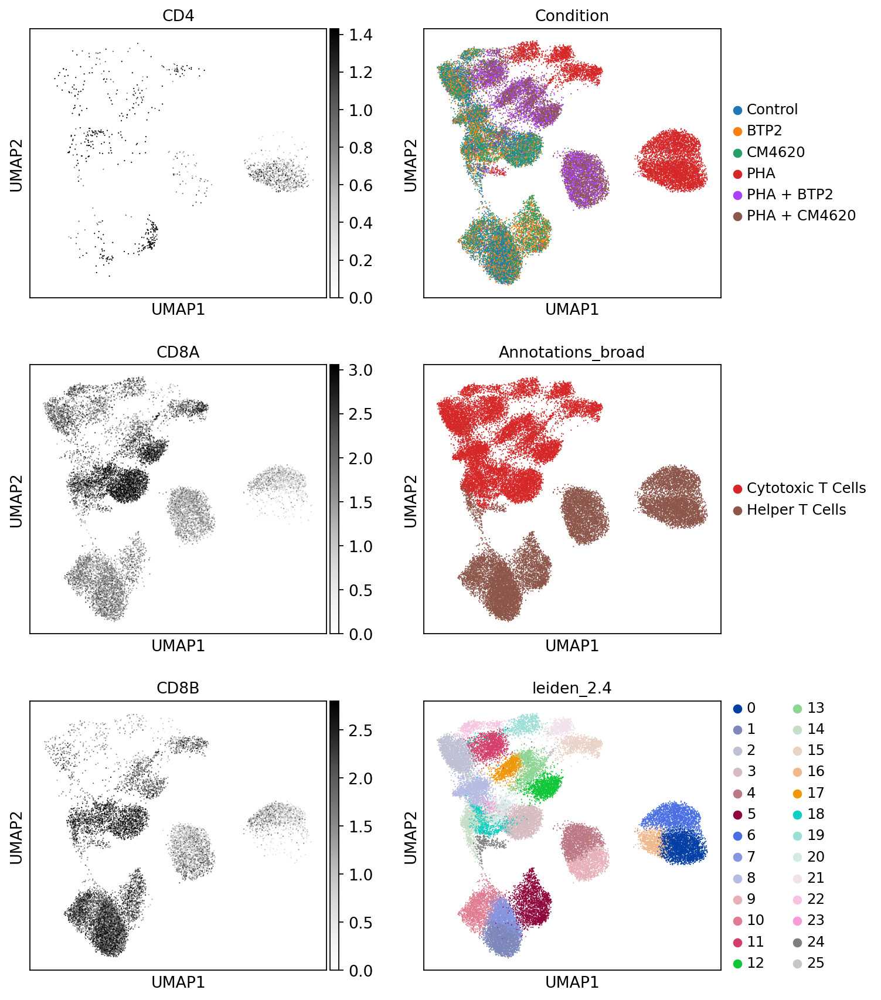

In [16]:

sc.pl.umap(adata_CD8, color=['CD4',"Condition",'CD8A','Annotations_broad','CD8B','leiden_2.4'],ncols=2,cmap='Greys',vmax='p99.3')

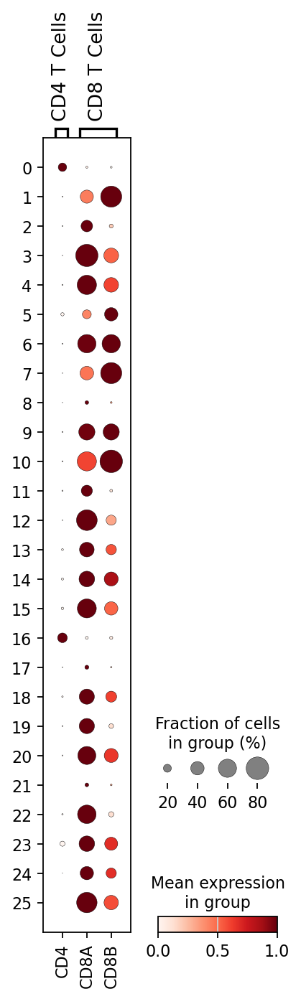

In [17]:
# Define simple marker sets to distinguish missclassified CD4+ T cells in CD8+ T cells
replacement = {
    'CD4 T Cells': ['CD4'],
    'CD8 T Cells': ['CD8A', 'CD8B']
}

# Generate a dot plot showing expression of CD4/CD8 markers across Leiden clusters (resolution 2.4)
sc.pl.dotplot(
    adata_CD8,
    var_names=replacement,        # Dictionary of marker genes
    groupby="leiden_2.4",         # Grouping based on Leiden clustering
    dot_min=0,                    # Minimum dot size (low expression)
    dot_max=0.8,                  # Maximum dot size (to avoid oversized dots)
    dendrogram=False,             # Disable clustering of groups
    standard_scale='group'        # Scale expression per gene group
)

In [18]:
# Define a mapping from Leiden cluster IDs (resolution 2.4) to broad T cell types
broad_cluster_names = {
    "0":  "CD4+ T Cells",
    "1":  "CD8+ T Cells",
    "2":  "CD8+ T Cells",
    "3":  "CD8+ T Cells",
    "4":  "CD8+ T Cells",
    "5":  "CD8+ T Cells",
    "6":  "CD8+ T Cells",
    "7":  "CD8+ T Cells",
    "8":  "CD8+ T Cells",
    "9":  "CD8+ T Cells",
    "10": "CD8+ T Cells",
    "11": "CD8+ T Cells",
    "12": "CD8+ T Cells",
    "13": "CD8+ T Cells",
    "14": "CD8+ T Cells",
    "15": "CD8+ T Cells",
    "16": "CD4+ T Cells",
    "17": "CD8+ T Cells",
    "18": "CD8+ T Cells",
    "19": "CD8+ T Cells",
    "20": "CD8+ T Cells",
    "21": "CD8+ T Cells",
    "22": "CD8+ T Cells",
    "23": "CD8+ T Cells",
    "24": "CD8+ T Cells",
    "25": "CD8+ T Cells"
}

# Apply the mapping to annotate T cell subclusters with broad CD4/CD8 identity
adata_CD8.obs['T_cell_sub'] = adata_CD8.obs['leiden_2.4'].map(broad_cluster_names)


In [19]:
# Transfer reannotated T cell subtype annotation from adata_CD8
adata_T.obs['CD4_CD8_split_2'] = adata_CD8.obs['T_cell_sub']

#Fill in missing values (NaNs) with the broader annotation already present
adata_T.obs['CD4_CD8_split_2'].fillna(adata_T.obs['CD4_CD8_split'], inplace=True)


/tmp/ipykernel_2978136/3932154920.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata_T.obs['CD4_CD8_split_2'].fillna(adata_T.obs['CD4_CD8_split'], inplace=True)


In [20]:
adata_T.obs['CD4_CD8_split_2'].value_counts()

CD4_CD8_split_2
CD4+ T Cells    39831
CD8+ T Cells    28975
Name: count, dtype: int64

In [21]:
#Check CD4 cells for missclassified CD8 cells
adata_CD4 = adata_T[adata_T.obs['CD4_CD8_split_2']=='CD4+ T Cells']
adata_CD4

View of AnnData object with n_obs × n_vars = 39831 × 1443
    obs: 'ExperimentID', 'ConditionID', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'Donor', 'Condition', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'predicted_doublet_0.2', 'predicted_doublet_0.25', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'Annotations_broad', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'leiden_2.1', 'T_cell_sub', 'CD4_CD8_split', 'CD4_CD8_split_2'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variabl

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:08)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:23)
running Leiden clustering
    finished: found 23 clusters and added
    'leiden_2.1', the cluster labels (adata.obs, categorical) (0:00:09)
running Leiden clustering
    finished: found 25 clusters and added
    'leiden_2.2', the cluster labels (adata.obs, categorical) (0:00:08)
running Leiden clustering
    finished: found 26 clusters and added
    'leiden_2.3', the cluster labels (adata.obs, categorical) (0:00:08)
running Leiden clustering
    finished: found 28 clusters and added
    '

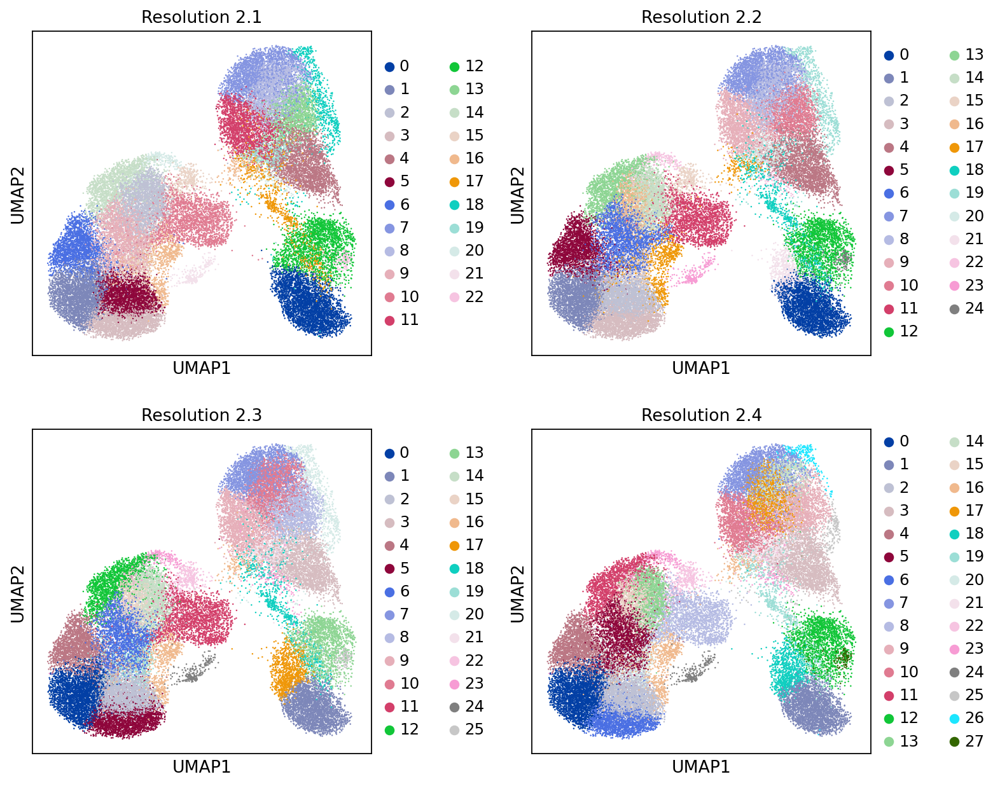

In [22]:
# Restore full AnnData object from raw (log-normalized) data
adata_CD4 = adata_CD4.raw.to_adata()

# Ensure log1p transformation base is correctly defined
adata_CD4.uns["log1p"]["base"] = None

# Identify highly variable genes across batches
sc.pp.highly_variable_genes(adata_CD4, batch_key="sample")

# Store a copy of the current state as raw
adata_CD4.raw = adata_CD4

# Subset the dataset to highly variable genes only
adata_CD4 = adata_CD4[:, adata_CD4.var.highly_variable]

# Scale the data (zero mean, unit variance, max clipping at 10)
sc.pp.scale(adata_CD4, max_value=10)

# Run PCA to reduce dimensionality
sc.tl.pca(adata_CD4, svd_solver="arpack")

# Compute neighborhood graph using first 20 principal components
sc.pp.neighbors(adata_CD4, n_pcs=20)

# Run UMAP for 2D embedding
sc.tl.umap(adata_CD4)

# Define Leiden resolutions to explore for clustering
resolutions = np.arange(2.1, 2.6, 0.1)

# Perform Leiden clustering for each resolution
for resolution in resolutions:
    key_added = f'leiden_{resolution:.1f}'
    sc.tl.leiden(
        adata_CD4,
        resolution=resolution,
        random_state=0,
        key_added=key_added
    )

# Visualize clustering for selected resolutions
plot_resolutions = np.arange(2.1, 2.5, 0.1)

# Set up subplot layout
n_rows, n_cols = 2, 2
fig, axs = plt.subplots(n_rows, n_cols, figsize=(10, 8))
axs = axs.flatten()

# Plot UMAPs for each selected resolution
for i, resolution in enumerate(plot_resolutions):
    key_added = f'leiden_{resolution:.1f}'
    sc.pl.umap(
        adata_CD4,
        color=[key_added],
        title=f'Resolution {resolution:.1f}',
        ax=axs[i],
        show=False,
        size=5
    )

# Final layout adjustments and show plot
plt.tight_layout()
plt.show()


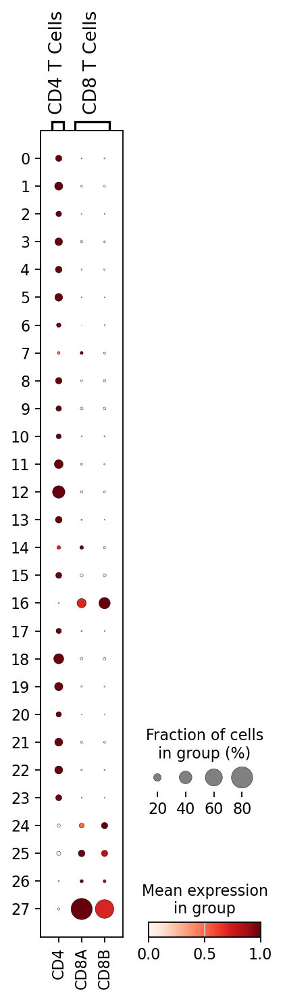

In [23]:
# Define key markers to distinguish CD4 vs CD8 identity
replacement = {
    'CD4 T Cells': ['CD4'],
    'CD8 T Cells': ['CD8A', 'CD8B']
}

# Generate a dot plot showing CD4/CD8 marker expression across Leiden clusters at resolution 2.4
sc.pl.dotplot(
    adata_CD4,
    var_names=replacement,        # Grouped gene markers
    groupby="leiden_2.4",         # Clustering resolution to compare
    dot_min=0,                    # Minimum dot size for low expression
    dot_max=0.8,                  # Maximum dot size for highly expressed genes
    dendrogram=False,             # Keep manual cluster order
    standard_scale='group'        # Normalize gene expression within each group (CD4 vs CD8)
)


In [24]:
# Define mapping of Leiden clusters (resolution 2.4) to broad CD4+/CD8+ T cell identities
broad_cluster_names = {
    "0":  "CD4+ T Cells",
    "1":  "CD4+ T Cells",
    "2":  "CD4+ T Cells",
    "3":  "CD4+ T Cells",
    "4":  "CD4+ T Cells",
    "5":  "CD4+ T Cells",
    "6":  "CD4+ T Cells",
    "7":  "CD4+ T Cells",
    "8":  "CD4+ T Cells",
    "9":  "CD4+ T Cells",
    "10": "CD4+ T Cells",
    "11": "CD4+ T Cells",
    "12": "CD4+ T Cells",
    "13": "CD4+ T Cells",
    "14": "CD4+ T Cells",
    "15": "CD4+ T Cells",
    "16": "CD8+ T Cells",
    "17": "CD4+ T Cells",
    "18": "CD4+ T Cells",
    "19": "CD4+ T Cells",
    "20": "CD4+ T Cells",
    "21": "CD4+ T Cells",
    "22": "CD4+ T Cells",
    "23": "CD4+ T Cells",
    "24": "CD8+ T Cells",
    "25": "CD8+ T Cells",
    "26": "CD8+ T Cells",
    "27": "CD8+ T Cells"
}

# Apply the mapping to assign a new T cell subtype label to each cell
adata_CD4.obs['T_cell_sub'] = adata_CD4.obs['leiden_2.4'].map(broad_cluster_names)


In [25]:
#Transfer refined CD4/CD8 annotations from adata_CD4 into adata_T
adata_T.obs['CD4_CD8_split_3'] = adata_CD4.obs['T_cell_sub']

#Fill in missing values with existing labels from the previous annotation step
# This ensures all cells in adata_T are assigned a CD4+/CD8+ label
adata_T.obs['CD4_CD8_split_3'].fillna(adata_T.obs['CD4_CD8_split_2'], inplace=True)


/tmp/ipykernel_2978136/2914582291.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata_T.obs['CD4_CD8_split_3'].fillna(adata_T.obs['CD4_CD8_split_2'], inplace=True)


In [26]:
adata_T.obs['CD4_CD8_split_3'].value_counts()

CD4_CD8_split_3
CD4+ T Cells    37907
CD8+ T Cells    30899
Name: count, dtype: int64

In [27]:
#save the clean CD4+ T cell object
CD4_clean = adata_T[adata_T.obs['CD4_CD8_split_3']=='CD4+ T Cells']
CD4_clean.write('Final_Notebooks/Final_Objects/T_Subset/CD4_subset_cleaned.h5ad')

/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


In [28]:
#save the clean CD8+ T cell object
CD8_clean = adata_T[adata_T.obs['CD4_CD8_split_3']=='CD8+ T Cells']
CD8_clean.write('Final_Notebooks/Final_Objects/T_Subset/CD8_subset_cleaned.h5ad')

/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


## Find CD4+ T-reg Cells in clean CD4 T cell data

In [29]:
#load clean CD4+ T cells
CD4_clean = sc.read_h5ad('Final_Notebooks/Final_Objects/T_Subset/CD4_subset_cleaned.h5ad')
CD4_clean

AnnData object with n_obs × n_vars = 37907 × 1443
    obs: 'ExperimentID', 'ConditionID', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'Donor', 'Condition', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'predicted_doublet_0.2', 'predicted_doublet_0.25', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'Annotations_broad', 'leiden_1.7', 'leiden_1.8', 'leiden_1.9', 'leiden_2.0', 'leiden_2.1', 'T_cell_sub', 'CD4_CD8_split', 'CD4_CD8_split_2', 'CD4_CD8_split_3'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'hig

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/as3562/miniconda3/envs/PBMC_env/lib/python3.9/site-packages/scanpy/preprocessing/_scale.py:318: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:22)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_2.2', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_2.3', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 21 clusters and added
    'leiden_2.4', the cluster labels (adata.obs, categorical) (0:00:06)
running Leiden clustering
    finished: found 25 clusters and added
    '

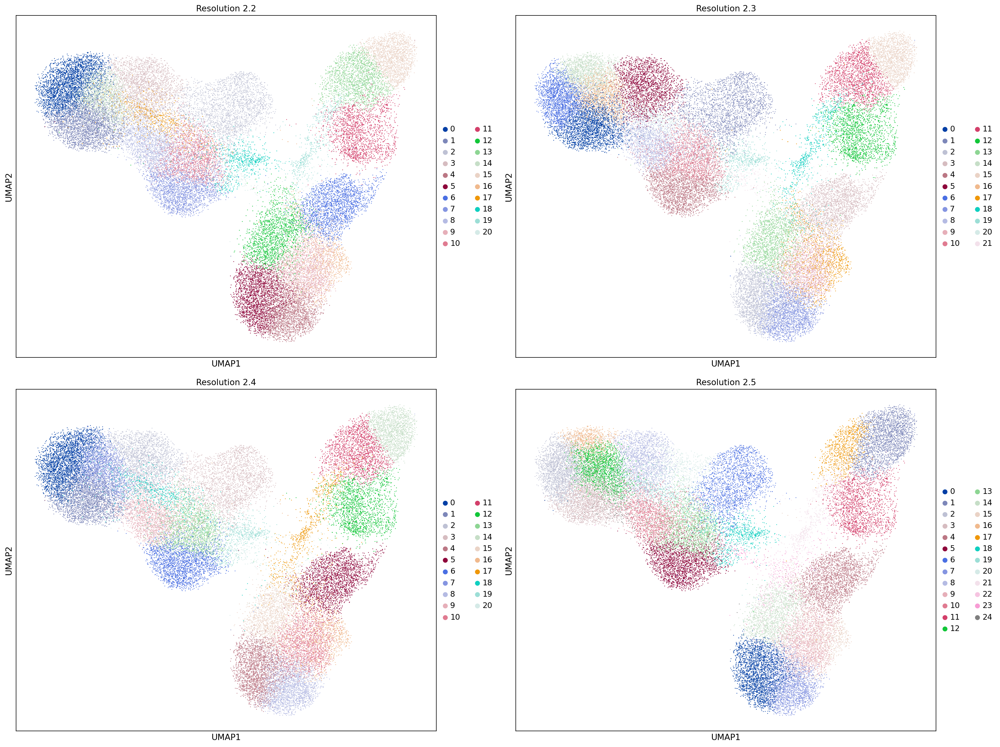

In [30]:
# Step 1: Convert raw matrix back to a full AnnData object
CD4_clean = CD4_clean.raw.to_adata()

# Step 2: Ensure correct log transformation settings
CD4_clean.uns["log1p"]["base"] = None

# Step 3: Identify highly variable genes with stricter thresholds
sc.pp.highly_variable_genes(
    CD4_clean,
    batch_key="sample",       # Account for sample-to-sample variability
    min_mean=0.1,             # Minimum average expression
    min_disp=1                # Minimum dispersion threshold
)

# Step 4: Store the filtered dataset as raw
CD4_clean.raw = CD4_clean

# Step 5: Subset to only highly variable genes
CD4_clean = CD4_clean[:, CD4_clean.var.highly_variable]

# Step 6: Scale the data (zero mean, unit variance) and clip extreme values at 10
sc.pp.scale(CD4_clean, max_value=10)

# Step 7: Run PCA to reduce dimensionality
sc.tl.pca(CD4_clean, svd_solver="arpack")

# Step 8: Construct nearest neighbor graph using first 15 PCs
sc.pp.neighbors(CD4_clean, n_pcs=15)

# Step 9: Run UMAP for 2D visualization
sc.tl.umap(CD4_clean)

# Step 10: Define a range of clustering resolutions to test
resolutions = np.arange(2.2, 2.6, 0.1)  # 2.2 to 2.5 inclusive

# Step 11: Run Leiden clustering at multiple resolutions
for resolution in resolutions:
    key_added = f'leiden_{resolution:.1f}'  # e.g., 'leiden_2.2'
    sc.tl.leiden(
        CD4_clean,
        resolution=resolution,
        random_state=0,
        key_added=key_added
    )

# Step 12: Visualize UMAPs across chosen Leiden resolutions
n_rows, n_cols = 2, 2
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 15))
axs = axs.flatten()

for i, resolution in enumerate(resolutions):
    key_added = f'leiden_{resolution:.1f}'
    sc.pl.umap(
        CD4_clean,
        color=[key_added],
        title=f'Resolution {resolution:.1f}',
        ax=axs[i],
        show=False,
        size=5
    )

plt.tight_layout()
plt.show()


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_2.5']`


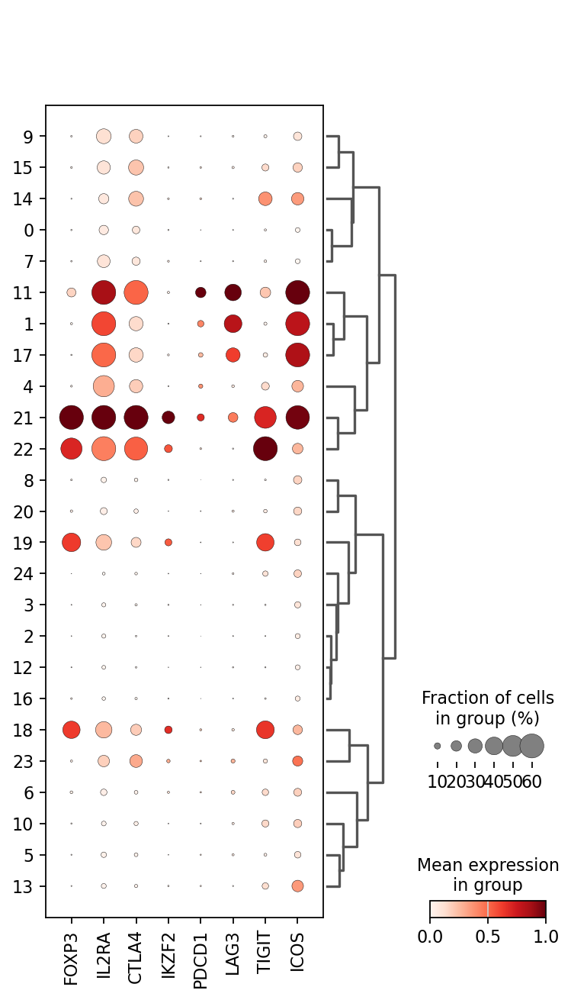

In [31]:
# Define canonical and functional marker genes associated with regulatory T cells (Tregs)
treg_markers = [
    "FOXP3",     # Master transcription factor for Treg identity
    "IL2RA",     # CD25, high-affinity IL-2 receptor alpha chain
    "CTLA4",     # Inhibitory receptor, constitutively expressed on Tregs
    "IKZF2",     # Helios, transcription factor enriched in thymic Tregs
    "PDCD1",     # PD-1, co-inhibitory receptor
    "LAG3",      # Co-inhibitory receptor
    "TIGIT",     # Inhibitory immune checkpoint
    "ICOS"       # Costimulatory molecule highly expressed in Tregs
]

# Plot expression of Treg markers across Leiden clusters (res=2.5) in CD4+ T cells
sc.pl.dotplot(
    CD4_clean,
    var_names=treg_markers,          # Treg marker genes
    groupby="leiden_2.5",            # Clusters at resolution 2.5
    dot_min=0,                       # Minimum dot size for visibility
    dot_max=0.6,                     # Maximum dot size to prevent saturation
    standard_scale='var',            # Normalize gene expression across clusters per gene
    dendrogram=True,                 # Cluster groupings by expression similarity
    vmax=1                           # Clip color scale at max 1 for better contrast
)

In [34]:
# Label all clusters as "CD4+ T Cells" by default
new_cluster_names = {str(i): "CD4+ T Cells" for i in range(28)}
# Overwrite specific clusters as "Treg Cells" based on marker expression
for cluster in ['18', '19', '21', '22']:
    new_cluster_names[cluster] = 'CD4+ Treg Cells'

# Apply new labels to create the Broad_Manual_Anno column
CD4_clean.obs["Broad_Manual_Anno"] = CD4_clean.obs['leiden_2.5'].map(new_cluster_names)


In [35]:
CD4_clean.obs["Broad_Manual_Anno"].value_counts()

Broad_Manual_Anno
CD4+ T Cells       35400
CD4+ Treg Cells     2507
Name: count, dtype: int64

In [36]:
# Load clean CD8+ T cells
CD8_clean = sc.read_h5ad('Final_Notebooks/Final_Objects/T_Subset/CD8_subset_cleaned.h5ad')

In [48]:
# Remap broad annotations to more specific CD8+ T cell subtypes
new_cluster_names = {
    "Cytotoxic T Cells": "CD8+ Effector T Cells",
    "Helper T Cells": "CD8+ Naive T Cells"
}

# Apply mapping to create a refined annotation column
CD8_clean.obs["Broad_Manual_Anno"] = CD8_clean.obs['Annotations_broad'].map(new_cluster_names)

In [49]:
CD8_clean.obs["Broad_Manual_Anno"].value_counts()

Broad_Manual_Anno
CD8+ Naive T Cells       15533
CD8+ Effector T Cells    15366
Name: count, dtype: int64

In [50]:
# Concatenate CD4+ and CD8+ T cell datasets into a combined AnnData object
adata_combined = ad.concat([CD4_clean, CD8_clean], join='outer')

In [40]:
# Standardize label for helper T cells to match broader CD4+ nomenclature
adata.obs['Annotations_broad'] = adata.obs['Annotations_broad'].replace(
    'Helper T Cells', 'CD4+ T Cells'
)


/tmp/ipykernel_2978136/3026268441.py:2: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['Annotations_broad'] = adata.obs['Annotations_broad'].replace(


In [41]:
adata.obs['Annotations_broad'].value_counts()

Annotations_broad
CD4+ T Cells                     53301
CD14+ Classical Monocytes        23207
Cytotoxic T Cells                15505
NK cells                         13402
B Cells                          11889
CD16+ non-Classical Monocytes     2367
Dendritic Cells                   1054
Plasma Cells                       128
Name: count, dtype: int64

In [51]:
# Merge refined annotations from adata_combined into adata,
# falling back to original annotations if missing
adata.obs['Broad_Manual_Anno'] = adata_combined.obs['Broad_Manual_Anno']
adata.obs['Broad_Manual_Anno'].fillna(adata.obs['Annotations_broad'], inplace=True)

/tmp/ipykernel_2978136/1304944423.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  adata.obs['Broad_Manual_Anno'].fillna(adata.obs['Annotations_broad'], inplace=True)


In [52]:
adata.obs['Broad_Manual_Anno'] = adata.obs['Broad_Manual_Anno'].replace('NK cells', 'NK Cells')


In [54]:
adata.obs['Broad_Manual_Anno'].value_counts()

Broad_Manual_Anno
CD4+ T Cells                     35400
CD14+ Classical Monocytes        23207
CD8+ Naive T Cells               15533
CD8+ Effector T Cells            15366
NK Cells                         13402
B Cells                          11889
CD4+ Treg Cells                   2507
CD16+ non-Classical Monocytes     2367
Dendritic Cells                   1054
Plasma Cells                       128
Name: count, dtype: int64

In [55]:
mapping_dict = {
    'CD4+ T Cells': 'CD4+ T Cells',
    'CD14+ Classical Monocytes': 'CD14+ Monocytes',
    'CD8+ Effector T Cells': 'CD8+ Effector T Cells',
    'CD8+ Naive T Cells': 'CD8+ Naive T Cells',
    'NK Cells': 'NK Cells',
    'B Cells': 'B Cells',
    'CD4+ Treg Cells': 'CD4+ Treg Cells', 
    'CD16+ non-Classical Monocytes': 'CD16+ Monocytes',
    'Dendritic Cells': 'Dendritic Cells',
    'Plasma Cells': 'Plasma Cells'
}

adata.obs['Broad_Manual_Anno_renamed'] = adata.obs['Broad_Manual_Anno'].map(mapping_dict)

In [56]:

manual_order = ['B Cells', 
                'CD14+ Monocytes', 
                'CD16+ Monocytes', 
                'Dendritic Cells', 
                'NK Cells', 
                'CD8+ Effector T Cells', 
                'CD8+ Naive T Cells', 
                'CD4+ T Cells', 
                'CD4+ Treg Cells', 
                'Plasma Cells']

adata.obs['Broad_Manual_Anno_renamed'] = pd.Categorical(adata.obs['Broad_Manual_Anno_renamed'], categories=manual_order, ordered=True)
adata.obs['Broad_Manual_Anno_renamed'].value_counts()

Broad_Manual_Anno_renamed
CD4+ T Cells             35400
CD14+ Monocytes          23207
CD8+ Naive T Cells       15533
CD8+ Effector T Cells    15366
NK Cells                 13402
B Cells                  11889
CD4+ Treg Cells           2507
CD16+ Monocytes           2367
Dendritic Cells           1054
Plasma Cells               128
Name: count, dtype: int64

In [57]:

manual_order = ['Control',
   'BTP2',
    'CM4620',
    'PHA',
    'PHA + BTP2',
    'PHA + CM4620']

adata.obs['Condition'] = pd.Categorical(adata.obs['Condition'], categories=manual_order, ordered=True)


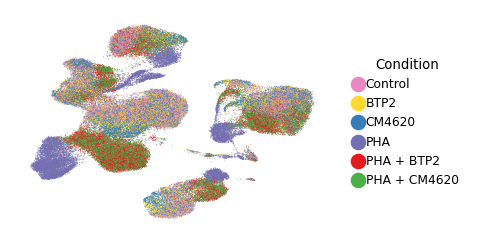

In [59]:
# Set global figure params
sc.set_figure_params(fontsize=6)

# Define custom color palette for the different experimental conditions
palette_cust = ['#e78ac3', '#ffd92f', '#377eb8', '#7570b3', '#e41a1c', '#4daf4a']

# Create the figure and axis object
fig, ax = plt.subplots(figsize=(2.5, 1.75))

# Plot UMAP colored by condition using the custom palette
sc.pl.umap(
    adata,
    color=['Condition'],
    ncols=1,
    title='',
    palette=palette_cust,
    ax=ax, 
    show=False,
    size=0.5,
    frameon=False
)

# Customize the legend
handles, labels = ax.get_legend_handles_labels()
legend = ax.legend(
    handles,
    labels,
    title='Condition',
    loc='center left',
    bbox_to_anchor=(1.05, 0.5),
    frameon=False
)
legend.get_title().set_fontproperties(fm.FontProperties())  # Optional: customize title font

# Save the figure as a high-res PDF
plt.savefig('Final_Notebooks/Figures/All_conditions/condition_UMAP.pdf', bbox_inches='tight', dpi=300)

# Show the figure
plt.show(fig)

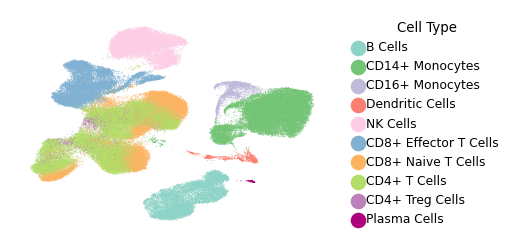

In [60]:
# Set Scanpy global plotting parameters
sc.set_figure_params(fontsize=6)

# Define custom color palette for cell types
celltype_color_dict = {
    'B Cells': '#8dd3c7',
    'CD14+ Monocytes': '#74c476',
    'CD16+ Monocytes': '#bebada',
    'Dendritic Cells': '#fb8072',
    'CD8+ Effector T Cells': '#80b1d3',
    'CD8+ Naive T Cells': '#fdb462',
    'CD4+ T Cells': '#b3de69',
    'NK Cells': '#fccde5',
    'Plasma Cells': '#ae017e',
    'CD4+ Treg Cells': '#bc80bd'
}

# Create figure and axis for tight layout
fig, ax = plt.subplots(figsize=(2.5, 1.75))

# UMAP plot colored by broad manual annotation
sc.pl.umap(
    adata,
    color=["Broad_Manual_Anno_renamed"],
    ncols=1,
    palette=celltype_color_dict,
    title='',
    ax=ax,
    show=False,
    size=0.5,
    frameon=False
)

# Build and customize legend
handles, labels = ax.get_legend_handles_labels()
legend = ax.legend(
    handles,
    labels,
    title='Cell Type',
    loc='center left',
    bbox_to_anchor=(1.05, 0.5),
    frameon=False
)
legend.get_title().set_fontproperties(fm.FontProperties())

# Save figure
plt.savefig('Final_Notebooks/Figures/All_conditions/UMAP.pdf', bbox_inches='tight', dpi=300)
plt.show(fig)


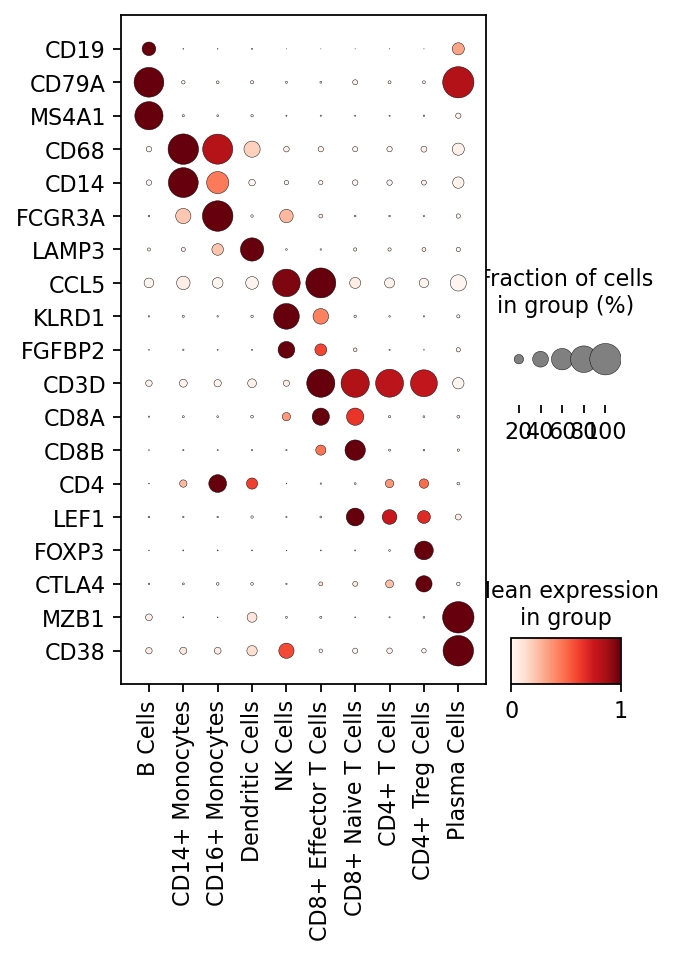

In [61]:
# Set Scanpy global plotting parameters
sc.set_figure_params(fontsize=12)

# Define marker genes for major immune lineages
genes = [
    'CD19', 'CD79A', 'MS4A1',       # B Cells
    'CD68', 'CD14', 'FCGR3A',       # Monocytes
    'LAMP3',                        # Dendritic Cells
    'CCL5',                         # T cell activation / Cytotoxicity
    'KLRD1', 'FGFBP2',              # NK Cells
    'CD3D', 'CD8A', 'CD8B',         # T Cells (CD8+)
    'CD4', 'LEF1',                  # CD4+ T Cells
    'FOXP3', 'CTLA4',               # Tregs
    'MZB1', 'CD38'                  # Plasma Cells
]

# Create figure and axis
fig, ax = plt.subplots(figsize=(4, 5.5))

# Generate dotplot with swapped axes
sc.pl.dotplot(
    adata,
    var_names=genes,
    groupby="Broad_Manual_Anno_renamed",
    dot_min=0,
    dot_max=1,
    dendrogram=False,
    standard_scale='var',
    swap_axes=True,
    ax=ax,
    show=False,
    figsize=(6.5, 1)
)

# Save high-resolution version of the plot
plt.savefig(
    'Final_Notebooks/Figures/All_conditions/dotplot_slim_textchange_fliped.pdf',
    bbox_inches='tight',
    dpi=300
)
plt.show(fig)


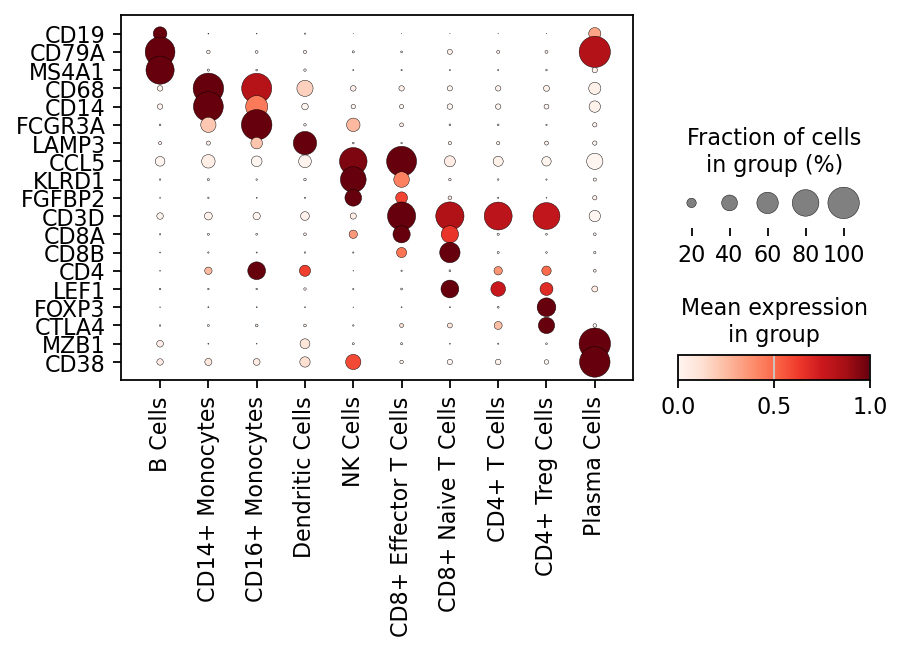

In [65]:
import matplotlib.pyplot as plt
import scanpy as sc

# Set Scanpy figure parameters
sc.set_figure_params(fontsize=12)

# Define figure size
fig, ax = plt.subplots(figsize=(6, 3))

# Dotplot for selected markers across broad manual annotations
sc.pl.dotplot(
    adata,
    var_names=genes,
    groupby="Broad_Manual_Anno_renamed",
    dot_min=0,
    dot_max=1,
    dendrogram=False,
    standard_scale='var',
    swap_axes=True,
    ax=ax,figsize=(5.5, 1),
    show=False
)

# Save the figure
plt.savefig(
    'Final_Notebooks/Figures/All_conditions/dotplot_scale bar.pdf',
    bbox_inches='tight',
    dpi=300
)

plt.show(fig)


/tmp/ipykernel_2978136/2483525943.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_data = adata.obs.groupby(['Broad_Manual_Anno_renamed', 'Condition']).size().unstack(fill_value=0)


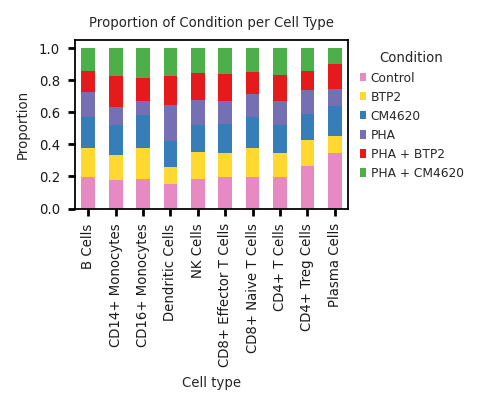

In [67]:
# Set aesthetic styles
sns.set(style="white")
sc.set_figure_params(fontsize=6)

# Group and count cells by broad annotation and condition
count_data = adata.obs.groupby(['Broad_Manual_Anno_renamed', 'Condition']).size().unstack(fill_value=0)

# Convert counts to proportions per cell type
proportion_data = count_data.div(count_data.sum(axis=1), axis=0)

# Custom color palette matching condition order
palette_cust = ['#e78ac3', '#ffd92f', '#377eb8', '#7570b3', '#e41a1c', '#4daf4a']

# Create stacked barplot of proportions
proportion_data.plot(
    kind='bar',
    stacked=True,
    figsize=(3, 2.5),
    color=palette_cust,
    edgecolor='none'
)

# Customize labels, legend, and axes
plt.xlabel('Cell type')
plt.ylabel('Proportion')
plt.title('Proportion of Condition per Cell Type', fontsize=6)
plt.legend(
    title='Condition',
    bbox_to_anchor=(1, 1),
    loc='upper left',
    frameon=False,
    title_fontsize=6
)
plt.grid(False)
plt.tick_params(axis='x', which='both', bottom=True, top=False, length=3, color='black')
plt.tick_params(axis='y', which='both', left=True, right=False, length=3, color='black')

# Final layout adjustments and save
plt.tight_layout()
plt.savefig('Final_Notebooks/Figures/All_conditions/Comp_Condition.pdf', bbox_inches='tight', dpi=300)
plt.show()


/tmp/ipykernel_2978136/3851177328.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_data = adata.obs.groupby(['Condition', 'Broad_Manual_Anno_renamed']).size().unstack(fill_value=0)


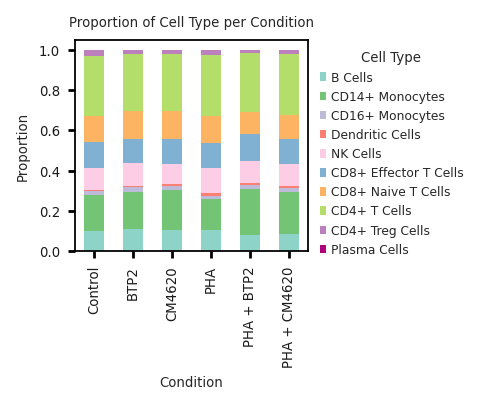

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set plot aesthetics
sns.set(style="white")
sc.set_figure_params(fontsize=6)

# Count cells per condition and cell type
count_data = adata.obs.groupby(['Condition', 'Broad_Manual_Anno_renamed']).size().unstack(fill_value=0)

# Convert to proportions (per condition)
proportion_data = count_data.div(count_data.sum(axis=1), axis=0)

# Plot: stacked bar chart of cell type proportions across conditions
proportion_data.plot(
    kind='bar',
    stacked=True,
    figsize=(3, 2.5),
    color=celltype_color_dict,
    edgecolor='none'
)

# Axis labels and styling
plt.xlabel('Condition')
plt.ylabel('Proportion')
plt.title('Proportion of Cell Type per Condition', fontsize=6)
plt.legend(
    title='Cell Type',
    bbox_to_anchor=(1, 1),
    loc='upper left',
    frameon=False,
    title_fontsize=6
)
plt.grid(False)
plt.tick_params(axis='x', which='both', bottom=True, top=False, length=3, color='black')
plt.tick_params(axis='y', which='both', left=True, right=False, length=3, color='black')

# Final layout and save
plt.tight_layout()
plt.savefig('Final_Notebooks/Figures/All_conditions/Comp_CellType.pdf', bbox_inches='tight', dpi=300)
plt.show()


/tmp/ipykernel_2978136/1700416344.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count_data = adata.obs.groupby(['Broad_Manual_Anno_renamed', 'Donor']).size().unstack(fill_value=0)


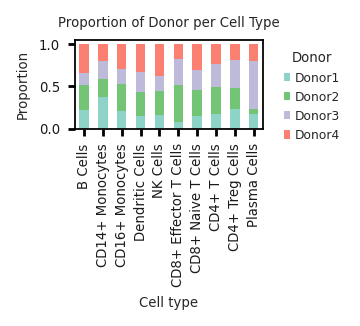

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set plotting aesthetics
sns.set(style="white")
sc.set_figure_params(fontsize=6)

# Group and count cells by cell type and donor
count_data = adata.obs.groupby(['Broad_Manual_Anno_renamed', 'Donor']).size().unstack(fill_value=0)

# Normalize counts to proportions per cell type
proportion_data = count_data.div(count_data.sum(axis=1), axis=0)

# Custom donor color palette (must match number/order of unique donors)
palette_cust = ['#8dd3c7', '#74c476', '#bebada', '#fb8072',
                '#80b1d3', '#fdb462', '#b3de69', '#fccde5',
                '#ae017e', '#bc80bd']  # Extend or trim as needed

# Plot stacked bar plot of donor contributions per cell type
proportion_data.plot(
    kind='bar',
    stacked=True,
    figsize=(2.25, 2),
    color=palette_cust,
    edgecolor='none'
)

# Customize plot
plt.xlabel('Cell type')
plt.ylabel('Proportion')
plt.title('Proportion of Donor per Cell Type', fontsize=6)
plt.legend(
    title='Donor',
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    frameon=False,
    title_fontsize=6
)
plt.grid(False)
plt.tick_params(axis='x', which='both', bottom=True, top=False, length=3, color='black')
plt.tick_params(axis='y', which='both', left=True, right=False, length=3, color='black')

# Save and show
plt.tight_layout()
# plt.savefig('figures/QC_Comp/Comp_CellType_Donor.pdf', bbox_inches='tight', dpi=300)
plt.show()


In [71]:
# Save final annotated Object
adata.write('Final_Notebooks/Final_Objects/PBMCs_anno_manual_refined_renamed.h5ad')

In [72]:
# Load final annotated Object
adata = sc.read_h5ad('Final_Notebooks/Final_Objects/PBMCs_anno_manual_refined_renamed.h5ad')

In [73]:
!pip list

Package                   Version
------------------------- --------------
adjustText                1.3.0
anndata                   0.10.9
anyio                     4.6.2.post1
argon2-cffi               23.1.0
argon2-cffi-bindings      21.2.0
array_api_compat          1.9.1
arrow                     1.3.0
asttokens                 2.4.1
async-lru                 2.0.4
attrs                     24.2.0
babel                     2.16.0
beautifulsoup4            4.12.3
bleach                    6.2.0
Brotli                    1.1.0
cached-property           1.5.2
certifi                   2024.8.30
cffi                      1.17.1
charset-normalizer        3.4.0
colorama                  0.4.6
comm                      0.2.2
contourpy                 1.3.0
cycler                    0.12.1
debugpy                   1.8.8
decorator                 5.1.1
defusedxml                0.7.1
entrypoints               0.4
et_xmlfile                2.0.0
exceptiongroup            1.2.2
executing    